In [1]:
import numpy as np
import pandas as pd 
from data_loader import result_df, bench, squat, deadlift
from plotly.subplots import make_subplots
import plotly.graph_objects as go


neal deadlift 0
brian deadlift 0
brian bench 0
tejas bench 0
novel bench 0
neal bench 0
brian bench 1
brian bench 2
tejas bench 1
novel bench 1
novel bench 2
brian bench 3
tejas bench 2
brian bench 4
tejas bench 3
neal bench 1
brian bench 5
novel bench 3
brian bench 6
brian squat 0
novel squat 0
brian squat 1
brian squat 2
tejas squat 0
novel squat 1
brian squat 3
novel squat 2
novel squat 3
neal squat 0
brian squat 4
{'bench': {'brian': 7, 'novel': 4, 'tejas': 4, 'neal': 2}, 'squat': {'brian': 5, 'novel': 4, 'tejas': 1, 'neal': 1}, 'deadlift': {'brian': 1, 'novel': 0, 'tejas': 0, 'neal': 1}}
                           relativeAltitude  seconds_elapsed    pressure  \
name  workout  set_number                                                  
brian bench    0                       0.00         7.011909  100.453018   
               0                       0.00         7.867835  100.453293   
               0                      -0.03        10.968242  100.454849   
               0    

In [2]:
result_df

relativeAltitude  seconds_elapsed    pressure  \
name  workout  set_number                                                  
brian bench    0                       0.00         7.011909  100.453018   
               0                       0.00         7.867835  100.453293   
               0                      -0.03        10.968242  100.454849   
               0                      -0.04        46.088523  100.455017   
               0                        NaN              NaN         NaN   
...                                     ...              ...         ...   
neal  deadlift 0                        NaN        40.367102         NaN   
               0                        NaN        40.377064         NaN   
               0                        NaN        40.387027         NaN   
               0                        NaN        40.396989         NaN   
               0                        NaN        40.406951         NaN   

                                   sensor          time  \
name  workout  set_number                                 
brian bench    0           WatchBarometer  1.726273e+18   
               0           WatchBarometer  1.726273e+18   
               0           WatchBarometer  1.726273e+18   
               0           WatchBarometer  1.726273e+18   
               0                 Metadata           NaN   
...                                   ...           ...   
neal  deadlift 0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   

                                                      device id  version  \
name  workout  set_number                                                  
brian bench    0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0           250fad1f-c20d-4511-bbbd-b39f8226ca7f      3.0   
...                                                         ...      ...   
neal  deadlift 0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   

                             device name sampleRateMs  recording epoch time  \
name  workout  set_number                                                     
brian bench    0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0           iPhone 15 Pro       10|10|          1.726273e+12   
...                                  ...          ...                   ...   
neal  deadlift 0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   

                           ...  gravityX rotationRateY rotationRateZ  \
name  workout  set_number  ...                                         
brian bench    0           ...       NaN           NaN           NaN   
               0           ...       

In [3]:
def plot(result_df, idx, n_rows, n_cols, name, labels):

    brian_bench_sets = result_df.loc[idx, :]
    unique_sets = result_df.index.get_level_values('set_number').unique()
    
    set_dfs = {set_num: result_df.xs(set_num, level='set_number') for set_num in unique_sets}
    
    unique_set_numbers = brian_bench_sets.index.get_level_values('set_number').unique()
    
    set_dfs = {set_num: brian_bench_sets.xs(set_num, level='set_number') for set_num in unique_set_numbers}
    print(set_dfs.keys())
    fig = make_subplots(rows=n_rows, cols=n_cols)
    
    for i in range(n_rows*n_cols):
        l = [set_dfs[i][e] for e in labels]
        x = list(range(len(l[0])))
    
        for j, e in enumerate(l):  # Use enumerate to get the index `j`
            fig.add_trace(
                go.Scatter(x=x, y=e, name=labels[j] + f' set {i}'),  # Access the label with `j`
                row=i // n_cols + 1, col=i % n_cols + 1
            )
    
    fig.update_layout(height=900, width=1000, title_text=name)
    fig.show()


In [6]:

idx = pd.IndexSlice
i = idx[['novel', 'brian'], 'bench', :]
#plot(result_df, i, 4, 3, 'brian bench', ['gravityX', 'gravityY', 'gravityZ'])

In [14]:
result_df.loc['novel', 'bench', :]

,relativeAltitude,seconds_elapsed,pressure,sensor,time,device id,version,device name,sampleRateMs,recording epoch time,...,gravityX,rotationRateY,rotationRateZ,gravityY,quaternionX,quaternionY,quaternionZ,gravityZ,accelerationX,rotationRateX
set_number,,,,,,,,,,,,,,,,,,,,,
0,-0.030001,22.981029,100.884613,WatchBarometer,1.727834e+18,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,Metadata,NaN,250fad1f-c20d-4511-bbbd-b39f8226ca7f,3.0,iPhone 15 Pro,10|10|,1.727834e+12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,0.129022,NaN,WristMotion,1.727834e+18,NaN,NaN,NaN,NaN,NaN,...,-0.311088,-0.114932,0.057843,-0.606882,-0.930425,1.830904e-17,-0.167175,0.731382,-0.010475,0.034754
0,NaN,0.138984,NaN,WristMotion,1.727834e+18,NaN,NaN,NaN,NaN,NaN,...,-0.310719,-0.079140,0.049068,-0.606473,-0.930558,3.801568e-04,-0.166820,0.731877,-0.004085,0.037832
0,NaN,0.148947,NaN,WristMotion,1.727834e+18,NaN,NaN,NaN,NaN,NaN,...,-0.310530,-0.052950,0.042893,-0.605928,-0.930701,6.560144e-04,-0.166596,0.732409,0.009581,0.074571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,NaN,30.856469,NaN,WristMotion,1.727833e+18,NaN,NaN,NaN,NaN,NaN,...,-0.476950,-0.060283,0.011727,-0.542440,-0.917394,-6.462020e-02,-0.279386,0.691577,0.002142,-0.159188
3,NaN,30.866431,NaN,WristMotion,1.727833e+18,NaN,NaN,NaN,NaN,NaN,...,-0.476994,-0.021977,0.017122,-0.543475,-0.917197,-6.415968e-02,-0.279386,0.690733,-0.023036,-0.212503
3,NaN,30.876394,NaN,WristMotion,1.727833e+18,NaN,NaN,NaN,NaN,NaN,...,-0.477472,0.030518,-0.003349,-0.544325,-0.916954,-6.373806e-02,-0.279638,0.689733,-0.034216,-0.176402


dict_keys([0, 1, 2, 3, 4, 5, 6])


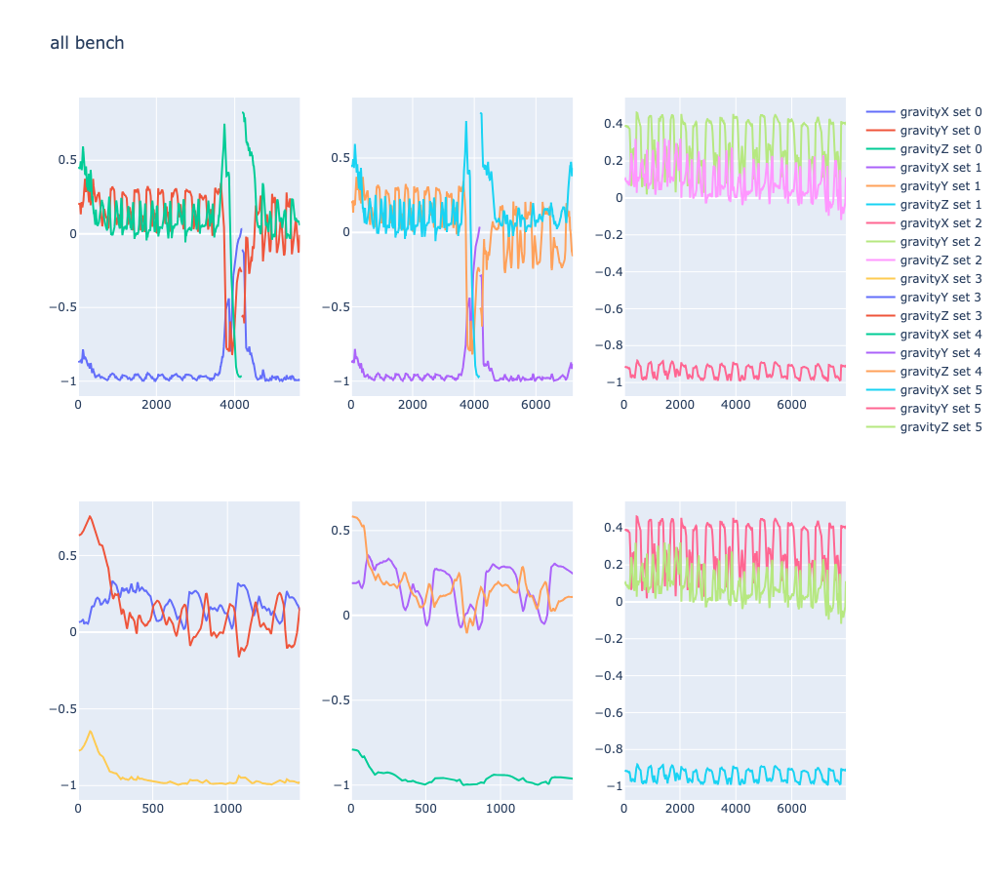

In [5]:

idx = pd.IndexSlice
i = idx[['brian', 'neal'] , 'bench', :]
plot(result_df, i, 2, 3, 'all bench', ['gravityX', 'gravityY', 'gravityZ'])

In [9]:
result_df.loc[i]

relativeAltitude  seconds_elapsed    pressure  \
name  workout set_number                                                  
novel bench   0                  -0.030001        22.981029  100.884613   
              0                        NaN              NaN         NaN   
              0                        NaN         0.129022         NaN   
              0                        NaN         0.138984         NaN   
              0                        NaN         0.148947         NaN   
...                                    ...              ...         ...   
brian bench   6                        NaN        78.864019         NaN   
              6                        NaN        78.873981         NaN   
              6                        NaN        78.883943         NaN   
              6                        NaN        78.893906         NaN   
              6                        NaN        78.903868         NaN   

                                  sensor          time  \
name  workout set_number                                 
novel bench   0           WatchBarometer  1.727834e+18   
              0                 Metadata           NaN   
              0              WristMotion  1.727834e+18   
              0              WristMotion  1.727834e+18   
              0              WristMotion  1.727834e+18   
...                                  ...           ...   
brian bench   6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   

                                                     device id  version  \
name  workout set_number                                                  
novel bench   0                                            NaN      NaN   
              0           250fad1f-c20d-4511-bbbd-b39f8226ca7f      3.0   
              0                                            NaN      NaN   
              0                                            NaN      NaN   
              0                                            NaN      NaN   
...                                                        ...      ...   
brian bench   6                                            NaN      NaN   
              6                                            NaN      NaN   
              6                                            NaN      NaN   
              6                                            NaN      NaN   
              6                                            NaN      NaN   

                            device name sampleRateMs  recording epoch time  \
name  workout set_number                                                     
novel bench   0                     NaN          NaN                   NaN   
              0           iPhone 15 Pro       10|10|          1.727834e+12   
              0                     NaN          NaN                   NaN   
              0                     NaN          NaN                   NaN   
              0                     NaN          NaN                   NaN   
...                                 ...          ...                   ...   
brian bench   6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   

                          ...  gravityX rotationRateY rotationRateZ  gravityY  \
name  workout set_number  ...                                                   
novel bench   0           ...       NaN           NaN           NaN       NaN   
              0           ...       NaN           NaN        

(slice(None, None, None), 'bench', slice(None, None, None))